In [1]:
%cd "~/moses-incons-pen-xp"
%load_ext autoreload
%autoreload 2

/home/xabush/moses-incons-pen-xp


In [2]:
import pyximport
pyximport.install(reload_support=True)

(None, <pyximport.pyximport.PyxImporter at 0x7f6568782b80>)

In [3]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
from sklearn import linear_model
from notebooks.manifold_reg.util import *
from notebooks.manifold_reg.grad_util import *
from sklearn.model_selection import train_test_split, KFold
from autograd import elementwise_grad as egrad
import scipy

In [13]:
X_log, beta_log, y_log = generate_log_data(20, 10, tf_on=4, val_tf=[5, 5, 5, 5], corr=0.7, n=100)
X_log_train, X_log_test, y_log_train, y_log_test = train_test_split(X_log, y_log, test_size=0.5, stratify=y_log)
y_log_train_c = y_log_train.copy()
y_log_test_c = y_log_test.copy()
y_log_train_c[y_log_train_c == 0] = -1
y_log_test_c[y_log_test_c == 0] = -1
assoc_mat_2 = get_assoc_mat(20, 10, 1)
L = scipy.sparse.csgraph.laplacian(assoc_mat_2, normed=True)

In [10]:
from importlib import reload
reload(lrb)

<module 'lrb' from '/home/xabush/moses-incons-pen-xp/notebooks/manifold_reg/lrb.cpython-39-x86_64-linux-gnu.so'>

In [17]:
import lrb
model = lrb.LogisticRegressionBounded(C=0.01, D=0.1)
sr = scipy.sparse.coo_matrix(X_log_train)
model.fit(sr, y_log_train, L, verbose=2, randomize=False, max_epochs=50, tol=1e-3, max_ls_steps=1000)

Initial Background pen 0.00000 - reloaded v2
C=0.01000, D=0.10000
epoch 0, delta=9.32516, rel_change=1.00000, ls_steps=0, avg. log_loss=0.13904, bp_pen=0.21294, lasso_pen=0.19544
epoch 1, delta=4.39561, rel_change=0.49196, ls_steps=0, avg. log_loss=0.10938, bp_pen=0.27901, lasso_pen=0.20005
epoch 2, delta=2.01066, rel_change=0.22324, ls_steps=0, avg. log_loss=0.10154, bp_pen=0.28581, lasso_pen=0.20524
epoch 3, delta=1.26496, rel_change=0.13898, ls_steps=0, avg. log_loss=0.09729, bp_pen=0.26101, lasso_pen=0.22119
epoch 4, delta=1.10979, rel_change=0.12257, ls_steps=0, avg. log_loss=0.09655, bp_pen=0.23810, lasso_pen=0.22981
epoch 5, delta=0.88973, rel_change=0.09901, ls_steps=0, avg. log_loss=0.09650, bp_pen=0.22578, lasso_pen=0.23622
epoch 6, delta=0.67203, rel_change=0.07543, ls_steps=0, avg. log_loss=0.09706, bp_pen=0.22269, lasso_pen=0.23809
epoch 7, delta=0.53346, rel_change=0.06030, ls_steps=0, avg. log_loss=0.09760, bp_pen=0.22410, lasso_pen=0.23931
epoch 8, delta=0.40890, rel_ch

In [18]:
model.coef_

array([ 0.13724779,  0.16324864,  0.08967402,  0.53212707,  0.        ,
        0.01656964,  0.        ,  0.78158321,  0.0320875 ,  0.29618448,
        0.        ,  1.20189813,  0.        ,  0.        ,  0.04047912,
        0.        ,  0.30090061,  0.        ,  0.        ,  0.07966287,
        0.        ,  0.        ,  1.11510118,  0.        ,  0.03009904,
        0.        ,  0.        ,  0.32671668,  0.        ,  0.        ,
        0.        ,  0.00882465,  0.1784585 ,  0.21275792,  0.        ,
        0.21178893,  0.        ,  0.        ,  0.        ,  0.        ,
        0.4929067 ,  0.        ,  0.25870828,  0.19931204,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [19]:
log_loss_cp(X_log_test, y_log_test, model.coef_)

0.3112782714382273

In [47]:
import traceback
import lrb
from notebooks.manifold_reg.log_util import log_msg

n_sim = 10
n_c = 10
c_vals = np.append([0.0], np.geomspace(0.01, 1, num=n_c-1))
d_vals = np.append([0.0], np.geomspace(0.01, 100, num=n_c-1))
train_errs_1 = np.zeros((n_sim, n_c, n_c))
test_errs_1 = np.zeros((n_sim, n_c, n_c))
# min_c_vals_1 = np.zeros(n_sim)
# min_d_vals_1 = np.zeros(n_sim)
betas_1 = np.zeros((n_sim, n_c, n_c, 220))
senstivity_scs_1 = np.zeros((n_sim, n_c, n_c))
specificty_scs_1 = np.zeros((n_sim, n_c, n_c))

n_folds = 5
cv = StratifiedKFold(n_splits=n_folds, random_state=42, shuffle=True)
assoc_mat_2 = get_assoc_mat(20, 10, 1)
L = scipy.sparse.csgraph.laplacian(assoc_mat_2, normed=True)
try:
    for n in range(n_sim):
        log_msg(f"Sim - {n + 1}")
        X_log, beta_log, y_log = generate_log_data(20, 10, tf_on=4, val_tf=[5, 5, 5, 5], corr=0.7, n=100)
        X_log_train, X_log_test, y_log_train, y_log_test = train_test_split(X_log, y_log, test_size=0.5, stratify=y_log)

        for i, c in enumerate(c_vals):
            for k, d in enumerate(d_vals):
                j = 0
                fold_errs = np.zeros((n_folds))
                for train_idx, test_idx in cv.split(X_log_train, y_log_train):
                    x_train_cv, x_test_cv = X_log_train[train_idx], X_log_train[test_idx]
                    y_train_cv, y_test_cv = y_log_train[train_idx], y_log_train[test_idx]
                    cdn = lrb.LogisticRegressionBounded(C=c, D=d)
                    cdn.fit(scipy.sparse.coo_matrix(x_train_cv), y_train_cv, L, randomize=False, max_epochs=50, verbose=2, tol=1e-3, max_ls_steps=1000)
                    fold_errs[j] = log_loss_cp(x_test_cv, y_test_cv, cdn.coef_)
                    j += 1

                train_errs_1[n, i, k] = np.mean(fold_errs)
                cdn = lrb.LogisticRegressionBounded(C=c, D=d)
                cdn.fit(scipy.sparse.coo_matrix(X_log_train), y_log_train, L, randomize=False, max_epochs=50, verbose=2, tol=1e-3, max_ls_steps=1000)
                t_err = log_loss_cp(X_log_test, y_log_test, cdn.coef_)
                print(f"C={c}, D={d}, test_err: {t_err}")
                test_errs_1[n, i, k] = t_err
                betas_1[n, i, k] = cdn.coef_
                sensitivity, specificty = calculate_sens_spec(cdn.coef_)
                senstivity_scs_1[n, i, k] = sensitivity
                specificty_scs_1[n, i, k] = specificty


    log_msg("Exp 1 Done")

except Exception as e:
    log_msg("Oh, no! An error occurred. Here is the error message")
    log_msg(traceback.format_exc())

Sim - 1
Initial Background pen 0.00000 - reloaded v2
C=0.00000, D=0.00000
epoch 0, delta=8.81344, rel_change=1.00000, ls_steps=0, avg. log_loss=0.11964, bp_pen=0.00000, lasso_pen=0.00000
epoch 1, delta=1.17635, rel_change=0.12350, ls_steps=12223, avg. log_loss=0.08934, bp_pen=0.00000, lasso_pen=0.00000
epoch 2, delta=0.38840, rel_change=0.04096, ls_steps=25698, avg. log_loss=0.08469, bp_pen=0.00000, lasso_pen=0.00000
epoch 3, delta=0.00236, rel_change=0.00025, ls_steps=35291, avg. log_loss=0.08463, bp_pen=0.00000, lasso_pen=0.00000
relative change below tolerance; stopping after 3 epochs
Initial Background pen 0.00000 - reloaded v2
C=0.00000, D=0.00000
epoch 0, delta=10.19187, rel_change=1.00000, ls_steps=0, avg. log_loss=0.10543, bp_pen=0.00000, lasso_pen=0.00000
epoch 1, delta=0.91539, rel_change=0.08850, ls_steps=18050, avg. log_loss=0.08878, bp_pen=0.00000, lasso_pen=0.00000
epoch 2, delta=0.22536, rel_change=0.02169, ls_steps=22191, avg. log_loss=0.08495, bp_pen=0.00000, lasso_pen

In [ ]:
import traceback
import lrb
from notebooks.manifold_reg.log_util import log_msg

n_sim = 10
n_c = 10
c_vals = np.append([0.0], np.geomspace(0.01, 1, num=n_c - 1))
d_vals = np.append([0.0], np.geomspace(0.01, 100, n_c - 1))
train_errs_2 = np.zeros((n_sim))
test_errs_2 = np.zeros((n_sim))
min_c_vals_2 = np.zeros(n_sim)
min_d_vals_2 = np.zeros(n_sim)
betas_2 = np.zeros((n_sim, 2200))
senstivity_scs_2 = np.zeros(n_sim)
specificty_scs_2 = np.zeros(n_sim)

n_folds = 5
cv = StratifiedKFold(n_splits=n_folds, random_state=42, shuffle=True)
assoc_mat_2 = get_assoc_mat(200, 10, 0.7)
L = scipy.sparse.csgraph.laplacian(assoc_mat_2, normed=True)
try:
    for n in range(n_sim):
        log_msg(f"Sim - {n + 1}")
        X_log, beta_log, y_log = generate_log_data(200, 10, tf_on=4, val_tf=[5, 5, 5, 5], corr=0.7, n=100)
        X_log_train, X_log_test, y_log_train, y_log_test = train_test_split(X_log, y_log, test_size=0.5, stratify=y_log)

        train_cv_err = np.zeros((n_c, n_c))
        fold_errs = np.zeros((n_folds, n_c, n_c))
        j = 0
        for train_idx, test_idx in cv.split(X_log_train, y_log_train):
            x_train_cv, x_test_cv = X_log_train[train_idx], X_log_train[test_idx]
            y_train_cv, y_test_cv = y_log_train[train_idx], y_log_train[test_idx]
            for i, c in enumerate(c_vals):
                for k, d in enumerate(c_vals):
                    cdn = lrb.LogisticRegressionBounded(C=c, D=d)
                    cdn.fit(scipy.sparse.coo_matrix(x_train_cv), y_train_cv, L, randomize=False, max_epochs=50, verbose=2, tol=1e-3, max_ls_steps=1000)
                    fold_errs[j, i, k] = log_loss_cp(x_test_cv, y_test_cv, cdn.coef_)
            j += 1


        fold_err_mean = np.mean(fold_errs, axis=0)

        min_idx = np.unravel_index(np.argmin(fold_err_mean), fold_err_mean.shape)
        train_errs_2[n] = fold_err_mean[min_idx]
        min_c = c_vals[min_idx[0]]
        min_d = d_vals[min_idx[1]]
        min_c_vals_2[n] = min_c
        min_d_vals_2[n] = min_d

        cdn = lrb.LogisticRegressionBounded(C=min_c, D=min_d)
        cdn.fit(scipy.sparse.coo_matrix(X_log_train), y_log_train, L, randomize=False, max_epochs=50, verbose=2, tol=1e-3, max_ls_steps=1000)
        t_err = log_loss_cp(X_log_test, y_log_test, cdn.coef_)
        print(f"C={min_c}, D={min_d}, test_err: {t_err}")
        test_errs_2[n] = t_err
        betas_2[n] = cdn.coef_
        sensitivity, specificty = calculate_sens_spec(cdn.coef_)
        senstivity_scs_2[n] = sensitivity
        specificty_scs_2[n] = specificty

    log_msg("Exp 2 Done")

except Exception as e:
    log_msg("Oh, no! An error occurred. Here is the error message")
    log_msg(traceback.format_exc())

In [87]:
train_errs_m_1 = np.mean(train_errs_1, axis=0)
test_errs_m_1 = np.mean(test_errs_1, axis=0)
betas_m_1 = np.mean(betas_1, axis=0)

In [86]:
print(np.unravel_index(np.argmin(train_errs_m_1), train_errs_m_1.shape))
print(np.unravel_index(np.argmin(test_errs_m_1), test_errs_m_1.shape))

(0, 2)
(7, 9)


In [79]:
train_errs_m_1

array([[0.30707525, 0.30619232, 0.30573367, 0.3589619 , 0.37890424,
        0.36077438, 0.33460536, 0.32113944, 0.31931548, 0.32720487],
       [0.31285913, 0.30932871, 0.33912578, 0.39020257, 0.38225883,
        0.36216916, 0.33413368, 0.32157273, 0.31953016, 0.32685436],
       [0.32658031, 0.3382014 , 0.37369708, 0.3938539 , 0.38667721,
        0.36085467, 0.33455214, 0.321789  , 0.31928566, 0.3265728 ],
       [0.37419067, 0.3935174 , 0.40150482, 0.40826978, 0.38765738,
        0.36320027, 0.33581469, 0.32318006, 0.32021719, 0.32556479],
       [0.42399875, 0.42829189, 0.42552517, 0.41074327, 0.38801353,
        0.36381187, 0.33949364, 0.32680392, 0.32008298, 0.32350211],
       [0.43999461, 0.43518054, 0.42706388, 0.410709  , 0.38803607,
        0.36448017, 0.34449123, 0.32835892, 0.31959078, 0.32087955],
       [0.43999998, 0.43518073, 0.42706388, 0.410709  , 0.38803607,
        0.36474401, 0.34782661, 0.32875258, 0.31942892, 0.3196698 ],
       [0.43999998, 0.43518073, 0.4270638

In [80]:
test_errs_m_1

array([[0.31766618, 0.31776417, 0.32736414, 0.33808896, 0.34206038,
        0.31894943, 0.29378766, 0.28231443, 0.28370496, 0.28338366],
       [0.33322893, 0.32932064, 0.34100132, 0.34546109, 0.34383786,
        0.3188728 , 0.29425271, 0.28250571, 0.28305778, 0.28317146],
       [0.33635961, 0.34408719, 0.35262386, 0.36238603, 0.3418215 ,
        0.31769456, 0.2943283 , 0.28371297, 0.28290947, 0.28266325],
       [0.36224633, 0.37049751, 0.37464911, 0.35975046, 0.34381474,
        0.31809157, 0.29488927, 0.28688433, 0.28284794, 0.28208745],
       [0.38352687, 0.37951088, 0.37463709, 0.35706801, 0.34192289,
        0.31878643, 0.29599608, 0.28612436, 0.28267243, 0.2819805 ],
       [0.38289927, 0.37839753, 0.37059286, 0.35706801, 0.34192289,
        0.32040146, 0.29748718, 0.28604827, 0.28146536, 0.28172502],
       [0.38289927, 0.37839753, 0.37059286, 0.35706801, 0.34192289,
        0.32040146, 0.30082667, 0.2862402 , 0.28146536, 0.28130994],
       [0.38289927, 0.37839753, 0.3705928

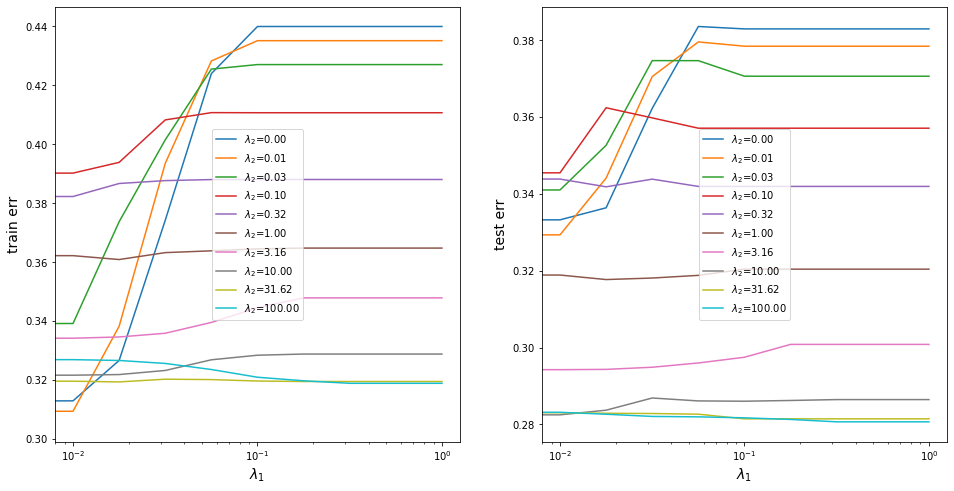

In [112]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))

for i in range(10):
    ax[0].plot(c_vals, train_errs_m_1[:,i], label=f"$\lambda_2$={d_vals[i]:.2f}")
    ax[1].plot(c_vals, test_errs_m_1[:,i], label=f"$\lambda_2$={d_vals[i]:.2f}")

ax[0].set_xlabel("$\lambda_1$", fontsize=14)
ax[1].set_xlabel("$\lambda_1$", fontsize=14)
ax[0].set_ylabel("train err", fontsize=14)
ax[1].set_ylabel("test err", fontsize=14)
ax[0].set_xscale('log')
ax[1].set_xscale('log')
ax[0].legend()
ax[1].legend()

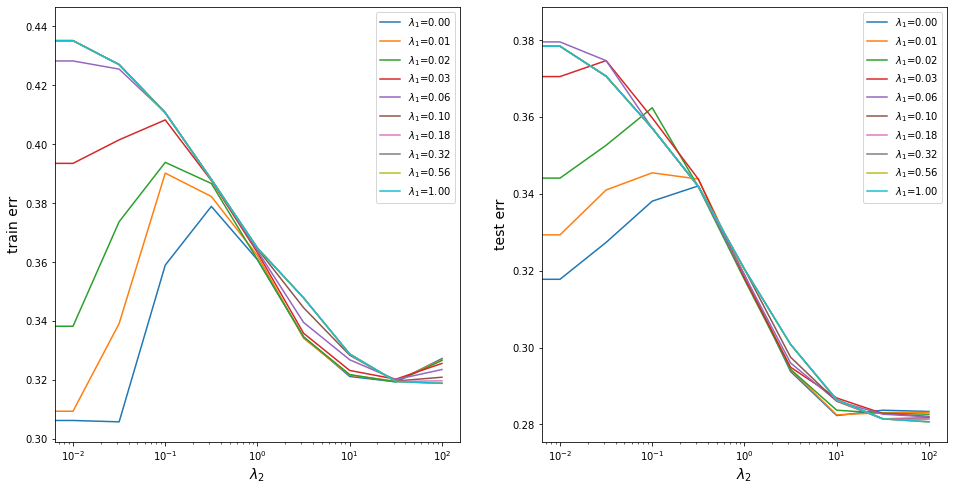

In [113]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))

for i in range(10):
    ax[0].plot(d_vals, train_errs_m_1[i], label=f"$\lambda_1$={c_vals[i]:.2f}")
    ax[1].plot(d_vals, test_errs_m_1[i], label=f"$\lambda_1$={c_vals[i]:.2f}")

ax[0].set_xlabel("$\lambda_2$", fontsize=14)
ax[1].set_xlabel("$\lambda_2$", fontsize=14)
ax[0].set_ylabel("train err", fontsize=14)
ax[1].set_ylabel("test err", fontsize=14)
ax[0].set_xscale('log')
ax[1].set_xscale('log')
ax[0].legend()
ax[1].legend()

In [114]:
c_vals[7]

0.31622776601683794

In [ ]:
d

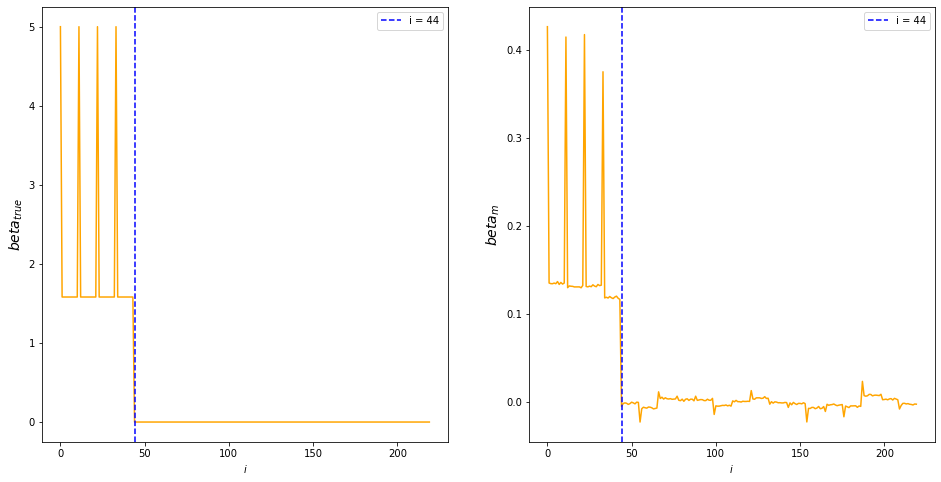

In [110]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
ax[0].plot(np.arange(0, 220), beta_log, color="orange")
ax[0].axvline(x=44, linestyle="--", color="blue", label="i = 44")
ax[1].plot(np.arange(0, 220), betas_m_1[7, 9], color="orange")
ax[1].axvline(x=44, linestyle="--", color="blue", label="i = 44")

ax[0].set_xlabel("$i$")
ax[1].set_xlabel("$i$")
ax[0].set_ylabel("$beta_{true}$", fontsize=14)
ax[1].set_ylabel("$beta_m$", fontsize=14)
ax[0].legend()
ax[1].legend()

In [61]:
np.mean(senstivity_scs_1, axis=0)

array([[0.49318182, 0.43863636, 0.37045455, 0.36363636, 0.48863636,
        0.69772727, 0.93636364, 1.        , 1.        , 1.        ],
       [0.36136364, 0.33181818, 0.31363636, 0.35454545, 0.48409091,
        0.7       , 0.93636364, 1.        , 1.        , 1.        ],
       [0.30227273, 0.30227273, 0.29545455, 0.34772727, 0.48863636,
        0.69772727, 0.93409091, 1.        , 1.        , 1.        ],
       [0.24318182, 0.25454545, 0.28181818, 0.34772727, 0.48409091,
        0.68863636, 0.93409091, 1.        , 1.        , 1.        ],
       [0.23409091, 0.25454545, 0.28181818, 0.34318182, 0.48863636,
        0.69318182, 0.93636364, 1.        , 1.        , 1.        ],
       [0.22727273, 0.25      , 0.27954545, 0.34318182, 0.48863636,
        0.69318182, 0.93636364, 1.        , 1.        , 1.        ],
       [0.22727273, 0.25      , 0.27954545, 0.34318182, 0.48863636,
        0.69318182, 0.93409091, 1.        , 1.        , 1.        ],
       [0.22727273, 0.25      , 0.2795454

In [65]:
np.mean(specificty_scs_1, axis=0)

array([[0.81704545, 0.86534091, 0.91477273, 0.92954545, 0.90625   ,
        0.86306818, 0.78352273, 0.65625   , 0.50340909, 0.37954545],
       [0.90909091, 0.91590909, 0.93181818, 0.92954545, 0.90852273,
        0.86306818, 0.78011364, 0.66022727, 0.51420455, 0.38579545],
       [0.92215909, 0.93238636, 0.93806818, 0.93125   , 0.90909091,
        0.86420455, 0.78011364, 0.65909091, 0.51761364, 0.39943182],
       [0.94318182, 0.94375   , 0.94147727, 0.93181818, 0.90852273,
        0.86761364, 0.78409091, 0.66761364, 0.52215909, 0.42102273],
       [0.94602273, 0.94375   , 0.94147727, 0.93181818, 0.90909091,
        0.86818182, 0.78465909, 0.67272727, 0.53295455, 0.43125   ],
       [0.94431818, 0.94261364, 0.94034091, 0.93181818, 0.90909091,
        0.86704545, 0.78806818, 0.67386364, 0.55568182, 0.45284091],
       [0.94431818, 0.94261364, 0.94034091, 0.93181818, 0.90909091,
        0.86704545, 0.78863636, 0.675     , 0.55568182, 0.48352273],
       [0.94431818, 0.94261364, 0.9403409

In [66]:
np.mean(betas_1, axis=0)[0,6]

array([ 4.13339940e-01,  1.39280727e-01,  1.05595965e-01,  1.25135255e-01,
        1.31188259e-01,  1.20327275e-01,  1.56405103e-01,  1.00188073e-01,
        1.30241724e-01,  1.04812683e-01,  1.16006456e-01,  4.21496311e-01,
        1.05864861e-01,  1.45375497e-01,  1.25350436e-01,  1.26362308e-01,
        1.07007952e-01,  1.08338868e-01,  1.10609270e-01,  1.09834073e-01,
        8.74092289e-02,  1.41427466e-01,  4.26252883e-01,  1.12947391e-01,
        8.34438812e-02,  1.29101725e-01,  9.94517226e-02,  1.58021548e-01,
        1.13278016e-01,  1.05727325e-01,  1.51733812e-01,  1.18970163e-01,
        1.29261346e-01,  3.96111858e-01,  1.07871134e-01,  1.45715002e-01,
        1.09630442e-01,  1.36972825e-01,  1.07484823e-01,  8.89373255e-02,
        1.13560249e-01,  1.36456207e-01,  8.85699376e-02,  6.38384235e-02,
       -7.51133038e-03, -1.12296415e-02, -1.56546429e-03, -1.17985395e-02,
       -1.50527089e-02, -4.47803392e-03,  0.00000000e+00,  1.27061420e-03,
       -3.07169039e-03,  

In [36]:
min_c_vals_1

array([0.01778279, 0.        , 0.        , 0.01      , 0.01778279,
       0.01778279, 0.        , 0.        , 0.        , 0.        ])

In [37]:
min_d_vals_1

array([0.        , 0.01      , 0.1       , 0.03162278, 0.01      ,
       0.1       , 0.        , 0.        , 0.1       , 0.31622777])

In [41]:
senstivity_scs_1

array([0.25      , 0.5       , 0.34090909, 0.31818182, 0.45454545,
       0.31818182, 0.5       , 0.63636364, 0.45454545, 0.47727273])

In [40]:
specificty_scs_1

array([0.91477273, 0.82954545, 0.92045455, 0.92613636, 0.95454545,
       0.96022727, 0.80681818, 0.84659091, 0.92045455, 0.89772727])

In [43]:
import lrb
model1 = lrb.LogisticRegressionBounded(C=0.00, D=0.0)
model2 = lrb.LogisticRegressionBounded(C=0.00, D=10.0)
sr = scipy.sparse.coo_matrix(X_log_train)
model1.fit(sr, y_log_train, L, verbose=2, randomize=False, max_epochs=100, tol=1e-3, max_ls_steps=100)
model2.fit(sr, y_log_train, L, verbose=2, randomize=False, max_epochs=100, tol=1e-3, max_ls_steps=100)

Initial Background pen 0.00000 - reloaded v1
epoch 0, delta=11.59855, rel_change=1.00000, ls_steps=0, log_loss=2.32392, bp_pen=0.00000, lasso_pen=0.00000
epoch 1, delta=0.73981, rel_change=0.06726, ls_steps=8025, log_loss=2.15104, bp_pen=0.00000, lasso_pen=0.00000
epoch 2, delta=0.00032, rel_change=0.00003, ls_steps=8500, log_loss=2.15104, bp_pen=0.00000, lasso_pen=0.00000
relative change below tolerance; stopping after 2 epochs
Initial Background pen 0.00000 - reloaded v1
epoch 0, delta=10.49690, rel_change=1.00000, ls_steps=2, log_loss=3.15616, bp_pen=2.29236, lasso_pen=0.78781
epoch 1, delta=4.61384, rel_change=0.47604, ls_steps=8784, log_loss=3.49954, bp_pen=1.15408, lasso_pen=-0.50418
epoch 2, delta=1.13250, rel_change=0.12207, ls_steps=12989, log_loss=3.70320, bp_pen=1.15749, lasso_pen=-0.54436
epoch 3, delta=0.35567, rel_change=0.03879, ls_steps=14512, log_loss=3.78355, bp_pen=1.16009, lasso_pen=-0.55175
epoch 4, delta=0.11104, rel_change=0.01215, ls_steps=15929, log_loss=3.8056

In [15]:
log_loss_cp(X_log_test, y_log_test, model.coef_)

0.6802876977203011

In [44]:
log_loss_cp(X_log_test, y_log_test, model1.coef_)

0.39643575630188627

In [45]:
log_loss_cp(X_log_test, y_log_test, model2.coef_)

0.47984990919221976

In [53]:
calculate_sens_spec(model.coef_)

tp: 10, fp: 29, fn: 34, tp: 10


(0.22727272727272727, 0.9865491651205937)

In [50]:
calculate_sens_spec(model2.coef_)

tp: 37, fp: 258, fn: 7, tp: 37


(0.8409090909090909, 0.8803339517625232)